# Remarks

* Data normalization
    * Mobilenet expects data from -1 to 1
        * Normalize Input Data or Include in Model
        * TFLite Conversion must fit according to decision
    * Ground Truth Data: for better inspection Data multiplied by 80. Undo the change in the Data Input Pipeline
* Overview in Tutorials:
    * tf.function
    * Repeat addapted Version of using Build in methods for training, ...
    * Save models using keras
        * CaseNet first real model: check implementation of Frey if a Layer needs to be written
        * other Example: depth seperable dilated convolution,

# Libraries

In [1]:
#!for a in /sys/bus/pci/devices/*; do echo 0 | sudo tee -a $a/numa_node; done

import tensorflow as tf
import numpy as np
import os
import time
from datetime import datetime
#import sys
import matplotlib.pyplot as plt
import argparse

import DataProcessing.data_processing as data_processing
import Nets.backbones as backbones
import Nets.features as features
import Nets.losses as losses
import Nets.metrics as metrics
import Nets.visualize as visualize
import Nets.tools as tools


os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'

#np.set_printoptions(threshold=sys.maxsize)

# Parser

In [2]:
parser = argparse.ArgumentParser()

parser.add_argument('--model', type=str, required=False, default=None)
parser.add_argument('--model_loaded', type=str, required=False, default=None)
parser.add_argument('--data', type=str, required=False, default=None)
parser.add_argument('--data_base_model', type=str, required=False, default=None)

parser.add_argument('--bs', type=int, required=False, default=None)
parser.add_argument('--idx', type=int, required=False, default=None)
parser.add_argument('--epoch', type=int, required=False, default=None)

parser.add_argument('--train_model', action='store_true', default=False)
parser.add_argument('--cache', action='store_true', default=False)
parser.add_argument('--save', action='store_true', default=False)
parser.add_argument('--sigmoid', action='store_true', default=False)
parser.add_argument('--focal', action='store_true', default=False)

parser.add_argument('--beta_upper', type=float, required=False, default=None)
parser.add_argument('--gamma', type=float, required=False, default=None)
parser.add_argument('--alpha', type=float, required=False, default=None)

file_name = None
try:
    file_name = __file__
except:
    print("Jupyter Notebook")
       
if file_name is None:
    args = parser.parse_args("")
    args.train_model = False
    args.cache = True
    args.save = True
    args.sigmoid = False
    args.focal = True
else:    
    args = parser.parse_args()

Jupyter Notebook


# Options

In [3]:
# Generall Parameters
#MODEL= 'CASENET_FOCAL_LOSS_0.8_g2_a2_REAL' if args.model is None else args.model
MODEL= 'SGED_FOCAL_LOSS_0.5_g2_a2_REAL' if args.model is None else args.model
MODEL_LOADED = 'SGED_FOCAL_LOSS_0.5_g2_a2' if args.model_loaded is None else args.model_loaded
DATA = 'RealRed' if args.data is None else args.data
DATA_BASE_MODEL_LOADED = 'SceneNetFloorTiledTextureRandom' if args.data_base_model is None else args.data_base_model
# DATA_BASE_MODEL_LOADED = 'RealRed' if args.data_base_model is None else args.data_base_model

TRAIN_DS = 'Train'
TEST_DS = 'Test'
TEST_HARD_DS = 'Test Hard'
TEST_IMG_DS = 'Test IMG'
HALF = True

# Dataset Loading Parameters
IMG_SIZE_HEIGHT = 1280
IMG_SIZE_WIDTH = 720
NUM_CLASSES = 3
MAX_IMG_TRAIN = 80
MAX_IMG_TEST = 25
SEED = None
BATCH_SIZE = 4 if args.bs is None else args.bs
CACHE = args.cache


# Model Parameters
TRAINABLE_IDX = 3
EPOCHS = 100 if args.epoch is None else args.epoch
SAVE = args.save
TRAIN_MODEL = args.train_model

#Model Callback
MODEL_SAVE_EPOCH_FREQ = 5
DEL_OLD_CHECKPOINTS = False
TENSORBOARD = False
DEL_OLD_TENSORBOARD = True

# LOSS
weighted_multi_label_sigmoid_edge_loss = args.sigmoid
focal_loss = args.focal

beta_upper = 0.5 if args.beta_upper is None else args.beta_upper
beta_lower = 1.0 - beta_upper
gamma=2.0 if args.gamma is None else args.gamma 
alpha=2.0 if args.alpha is None else args.alpha
class_weighted = True
weighted_beta=True

THRESHOLD_EDGE_WIDTH_REAL = 1


# Data Augmentation:
#aug_param = {"contrast_factor": 0.7, "brightness": 0.05, "hue": 0.02, "saturation": 0.7, "gaussian_value": 0.00,
#            "value": 0.05, "strength_spot": 0.3, "blur": False, "sigma": 1.0}
aug_param = {"contrast_factor": 0.9, "brightness": 0.05, "hue": 0.02, "saturation": 0.9, "gaussian_value": 0.00,
            "value": 0.05, "strength_spot": 0.2, "blur": False, "sigma": 1.0}


#TESTING
test = False
if test:
    EPOCHS = 10
    MAX_IMG_TRAIN = 100
    MAX_IMG_TEST = 10

# Load Dataset, Preprocess Images and Dataset

In [4]:
tf.random.set_seed(SEED)

paths, files = data_processing.path_definitions(HALF, MODEL, DATA, TRAIN_DS, TEST_DS, TEST_HARD_DS, TEST_IMG_DS, 
                                                MODEL_LOADED, DATA_BASE_MODEL_LOADED, make_dirs=True)

data_processing.clean_model_directories(paths, DEL_OLD_CHECKPOINTS, DEL_OLD_TENSORBOARD)

rng = tf.random.Generator.from_seed(123, alg='philox')
train_ds, img_count_train = data_processing.load_dataset(paths,"TRAIN", IMG_SIZE_HEIGHT, IMG_SIZE_WIDTH, HALF, MAX_IMG_TRAIN)
train_ds = data_processing.dataset_processing(train_ds, cache=CACHE, shuffle=False, batch_size=BATCH_SIZE, 
                                              prefetch=True, img_count=img_count_train, augment=True, rng=rng, 
                                              aug_param=aug_param)

#train_ds_2, img_count_train = data_processing.load_dataset(paths,"TRAIN", IMG_SIZE_HEIGHT, IMG_SIZE_WIDTH, HALF, MAX_IMG_TRAIN)
#train_ds_2 = data_processing.dataset_processing(train_ds_2, cache=CACHE, shuffle=True, batch_size=BATCH_SIZE, 
#                                              prefetch=True, img_count=img_count_train, augment=False)


test_ds, img_count_test = data_processing.load_dataset(paths,"TEST", IMG_SIZE_HEIGHT, IMG_SIZE_WIDTH, HALF, MAX_IMG_TEST)
test_ds = data_processing.dataset_processing(test_ds, cache=True, shuffle = False, batch_size=BATCH_SIZE, prefetch=True, img_count=img_count_test, augment=False)

test_hard_ds, img_count_test_hard = data_processing.load_dataset(paths,"TEST_HARD", IMG_SIZE_HEIGHT, IMG_SIZE_WIDTH, HALF, MAX_IMG_TEST)
test_hard_ds = data_processing.dataset_processing(test_hard_ds, cache=False, shuffle=False, batch_size=BATCH_SIZE,
                                                  prefetch=False, img_count=img_count_test_hard, augment=False)

test_img_ds, img_count_test_img = data_processing.load_dataset(paths,"IMG_ONLY", IMG_SIZE_HEIGHT, IMG_SIZE_WIDTH, HALF, MAX_IMG_TEST, has_mask=False)
test_img_ds = data_processing.dataset_processing(test_img_ds, cache=False, shuffle=False, batch_size=6, 
                                                 prefetch=False, img_count=img_count_test_img, augment=False)

if not os.path.exists(os.path.join(paths["FIGURES"],"PRE_TRAINING")):
    os.makedirs(os.path.join(paths["FIGURES"],"PRE_TRAINING"))
    os.makedirs(os.path.join(paths["FIGURES"],"POST_TRAINING"))

2022-06-08 11:35:52.792496: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-06-08 11:35:52.804989: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-06-08 11:35:52.805204: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-06-08 11:35:52.806232: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

The TRAIN Dataset contains 80 images.
The TEST Dataset contains 25 images.
The TEST_HARD Dataset contains 10 images.
The IMG_ONLY Dataset contains 10 images.


In [5]:
if TRAIN_MODEL:

    for image,label in train_ds.take(1):
        sample_image, sample_mask = image,label

        #visualize.plot_images(images=sample_image, labels=sample_mask, predictions=None, save=False, batch_size=BATCH_SIZE)
        visualize.plot_images(images=sample_image, labels=None, predictions=None, save=False, batch_size=BATCH_SIZE)

    #for image,label in train_ds_2.take(2):
    #    sample_image, sample_mask = image,label
    #
    #    #visualize.plot_images(images=sample_image, labels=sample_mask, predictions=None, save=False, batch_size=BATCH_SIZE)
    #    visualize.plot_images(images=sample_image, labels=None, predictions=None, save=False, batch_size=BATCH_SIZE)

# Model

In [6]:
if weighted_multi_label_sigmoid_edge_loss:
    loss = lambda y_true, y_pred : losses.weighted_multi_label_sigmoid_loss(y_true,y_pred,beta_lower=beta_lower,beta_upper=beta_upper, class_weighted=class_weighted)
elif focal_loss:
    loss = lambda y_true, y_pred : losses.focal_loss_edges(y_true, y_pred, gamma=gamma, alpha=alpha, weighted_beta=weighted_beta,beta_lower=beta_lower,beta_upper=beta_upper, class_weighted=class_weighted)
else:
    raise ValueError("either FocalLoss or WeightedMultiLabelSigmoidLoss must be True")
    

custom_objects = {"BinaryAccuracyEdges": metrics.BinaryAccuracyEdges,
                  "F1Edges": metrics.F1Edges,
                  "<lambda>":loss}

model = tf.keras.models.load_model(paths["MODEL LOADED"], custom_objects=custom_objects)


inputs = tf.keras.Input(shape=(IMG_SIZE_HEIGHT, IMG_SIZE_WIDTH, 3))
outputs = model(inputs, training=False)
model = tf.keras.Model(inputs, outputs)

# Metric Numerical Results before Fine Tuning on Real World Data

## test

2022-06-08 11:35:59.858908: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8100


7/7 - 4s - loss: 0.0000e+00 - accuracy_edges: 0.8585 - f1_1: 0.0234 - precision_1: 0.0118 - recall_1: 0.9971 - f1_2: 0.0402 - precision_2: 0.0205 - recall_2: 0.9990 - f1_3: 0.0504 - precision_3: 0.0259 - recall_3: 0.9790 - 4s/epoch - 592ms/step
7/7 - 1s - loss: 0.0000e+00 - accuracy_edges: 0.9442 - f1_1: 0.0705 - precision_1: 0.0366 - recall_1: 0.9863 - f1_2: 0.0919 - precision_2: 0.0482 - recall_2: 0.9930 - f1_3: 0.1874 - precision_3: 0.1041 - recall_3: 0.9395 - 1s/epoch - 150ms/step
7/7 - 1s - loss: 0.0000e+00 - accuracy_edges: 0.9674 - f1_1: 0.1238 - precision_1: 0.0661 - recall_1: 0.9682 - f1_2: 0.1529 - precision_2: 0.0829 - recall_2: 0.9801 - f1_3: 0.2992 - precision_3: 0.1797 - recall_3: 0.8927 - 1s/epoch - 144ms/step
7/7 - 1s - loss: 0.0000e+00 - accuracy_edges: 0.9777 - f1_1: 0.1638 - precision_1: 0.0896 - recall_1: 0.9452 - f1_2: 0.2154 - precision_2: 0.1213 - recall_2: 0.9630 - f1_3: 0.3809 - precision_3: 0.2456 - recall_3: 0.8482 - 1s/epoch - 146ms/step
7/7 - 1s - loss: 0.0

7/7 - 1s - loss: 0.0000e+00 - accuracy_edges: 0.9962 - f1_1: 0.0018 - precision_1: 0.6667 - recall_1: 8.8437e-04 - f1_2: 0.0246 - precision_2: 0.7333 - recall_2: 0.0125 - f1_3: 3.8873e-04 - precision_3: 1.0000 - recall_3: 1.9440e-04 - 961ms/epoch - 137ms/step
7/7 - 1s - loss: 0.0000e+00 - accuracy_edges: 0.9962 - f1_1: 0.0000e+00 - precision_1: 1.0000 - recall_1: 0.0000e+00 - f1_2: 0.0019 - precision_2: 0.7059 - recall_2: 9.7300e-04 - f1_3: 0.0000e+00 - precision_3: 1.0000 - recall_3: 0.0000e+00 - 961ms/epoch - 137ms/step
7/7 - 1s - loss: 0.0000e+00 - accuracy_edges: 0.9962 - f1_1: 0.0000e+00 - precision_1: 1.0000 - recall_1: 0.0000e+00 - f1_2: 0.0000e+00 - precision_2: 1.0000 - recall_2: 0.0000e+00 - f1_3: 0.0000e+00 - precision_3: 1.0000 - recall_3: 0.0000e+00 - 958ms/epoch - 137ms/step
7/7 - 1s - loss: 0.0000e+00 - accuracy_edges: 0.9962 - f1_1: 0.0000e+00 - precision_1: 1.0000 - recall_1: 0.0000e+00 - f1_2: 0.0000e+00 - precision_2: 1.0000 - recall_2: 0.0000e+00 - f1_3: 0.0000e+00 

7/7 - 1s - loss: 0.0000e+00 - accuracy_edges: 0.9965 - f1_1: 0.2577 - precision_1: 0.9241 - recall_1: 0.1497 - f1_2: 0.5106 - precision_2: 0.9326 - recall_2: 0.3516 - f1_3: 0.3071 - precision_3: 1.0000 - recall_3: 0.1814 - 958ms/epoch - 137ms/step
7/7 - 1s - loss: 0.0000e+00 - accuracy_edges: 0.9965 - f1_1: 0.1950 - precision_1: 0.9498 - recall_1: 0.1086 - f1_2: 0.4592 - precision_2: 0.9426 - recall_2: 0.3035 - f1_3: 0.2391 - precision_3: 1.0000 - recall_3: 0.1358 - 993ms/epoch - 142ms/step
7/7 - 1s - loss: 0.0000e+00 - accuracy_edges: 0.9965 - f1_1: 0.1294 - precision_1: 0.9697 - recall_1: 0.0693 - f1_2: 0.3961 - precision_2: 0.9513 - recall_2: 0.2501 - f1_3: 0.1562 - precision_3: 1.0000 - recall_3: 0.0847 - 1s/epoch - 154ms/step
7/7 - 1s - loss: 0.0000e+00 - accuracy_edges: 0.9964 - f1_1: 0.0734 - precision_1: 1.0000 - recall_1: 0.0381 - f1_2: 0.3134 - precision_2: 0.9570 - recall_2: 0.1874 - f1_3: 0.0885 - precision_3: 1.0000 - recall_3: 0.0463 - 1s/epoch - 152ms/step
7/7 - 1s - los

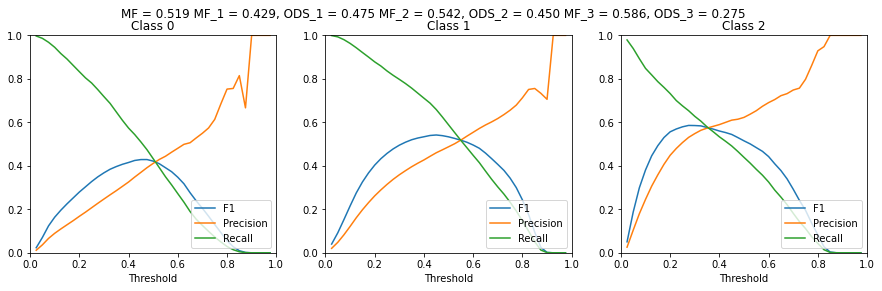

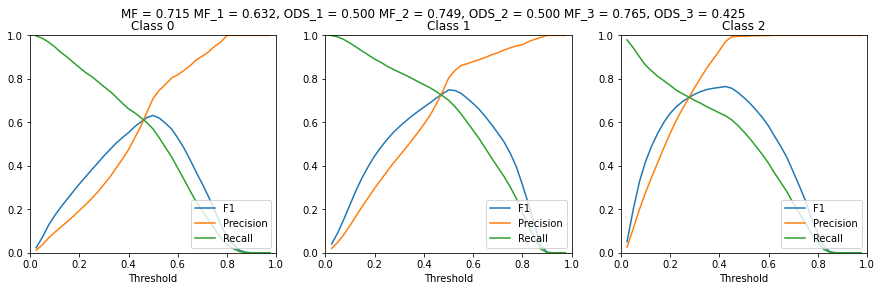

In [7]:
if not TRAIN_MODEL:

    step_width = 0.025
    threshold_range = [0.025,0.975]
    threshold_array = np.arange(threshold_range[0],threshold_range[1]+step_width,step_width)

    path_metrics_evaluation_plot = os.path.join(paths["FIGURES"],"PRE_TRAINING", "metric_test_threshold{:.1f}.svg".format(0))
    threshold_MF_test = visualize.plot_threshold_metrics_evaluation_class(model=model, 
                                                                          ds=test_ds, 
                                                                          num_classes=NUM_CLASSES, 
                                                                          threshold_array=threshold_array, 
                                                                          threshold_edge_width=0, 
                                                                          save=SAVE, 
                                                                          path=path_metrics_evaluation_plot,)

    path_metrics_evaluation_plot = os.path.join(paths["FIGURES"],"PRE_TRAINING", "metric_test_threshold{:.1f}.svg".format(THRESHOLD_EDGE_WIDTH_REAL))
    visualize.plot_threshold_metrics_evaluation_class(model=model, 
                                                      ds=test_ds,
                                                      num_classes=NUM_CLASSES,
                                                      threshold_array=threshold_array, 
                                                      threshold_edge_width=THRESHOLD_EDGE_WIDTH_REAL, 
                                                      save=SAVE, 
                                                      path=path_metrics_evaluation_plot,)

## test hard

if not TRAIN_MODEL:
    step_width = 0.05
    threshold_range = [0.05,0.95]
    threshold_array = np.arange(threshold_range[0],threshold_range[1]+step_width,step_width)

    path_metrics_evaluation_plot = os.path.join(paths["FIGURES"],"PRE_TRAINING", "metric_test_hard_threshold{:.1f}.svg".format(0))
    threshold_MF_test_hard = visualize.plot_threshold_metrics_evaluation_class(model=model, 
                                                                          ds=test_hard_ds, 
                                                                          num_classes=NUM_CLASSES, 
                                                                          threshold_array=threshold_array, 
                                                                          threshold_edge_width=0, 
                                                                          save=SAVE, 
                                                                          path=path_metrics_evaluation_plot)

    path_metrics_evaluation_plot = os.path.join(paths["FIGURES"],"PRE_TRAINING", "metric_test_hard_threshold{:.1f}.svg".format(THRESHOLD_EDGE_WIDTH_REAL))
    visualize.plot_threshold_metrics_evaluation_class(model=model, 
                                                      ds=test_ds,
                                                      num_classes=NUM_CLASSES,
                                                      threshold_array=threshold_array, 
                                                      threshold_edge_width=THRESHOLD_EDGE_WIDTH_REAL, 
                                                      save=SAVE, 
                                                      path=path_metrics_evaluation_plot)

# Visual Results before Fine Tuning on Real World Data

## test dataset

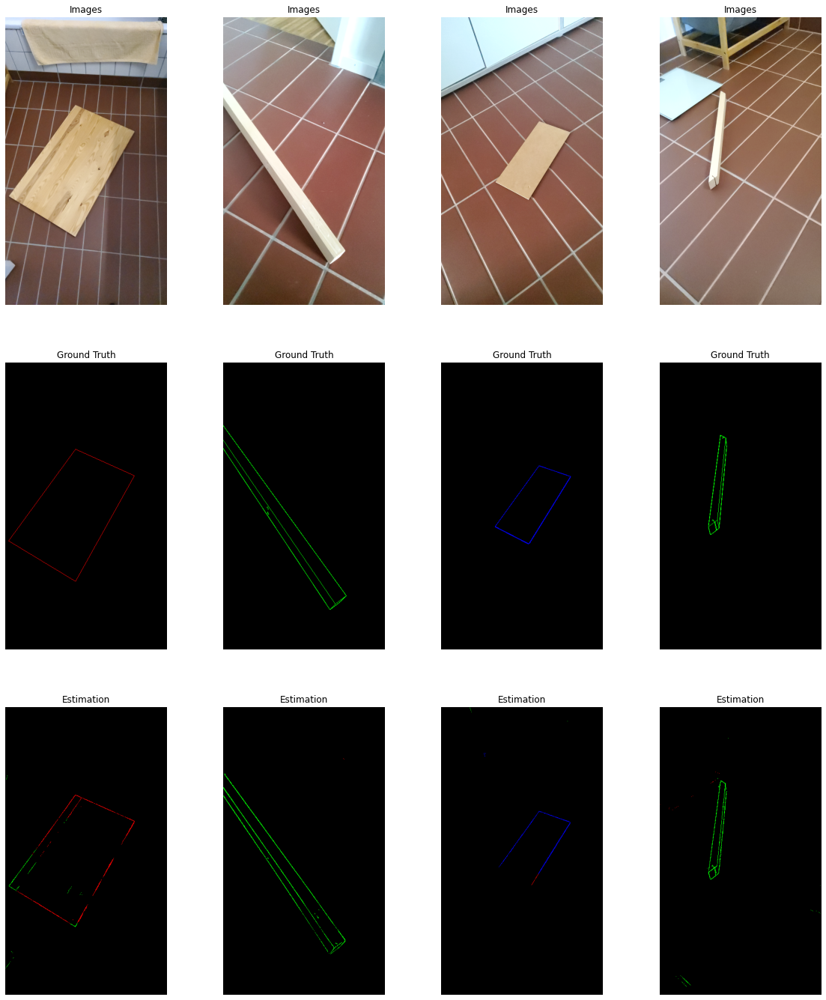

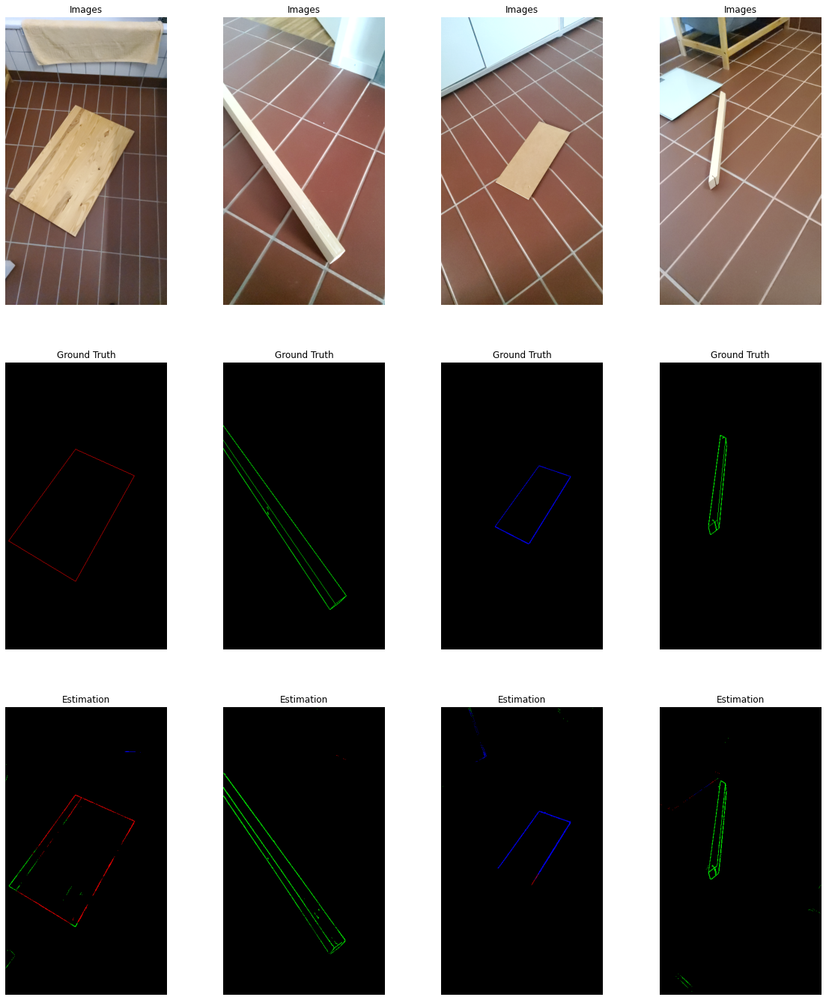

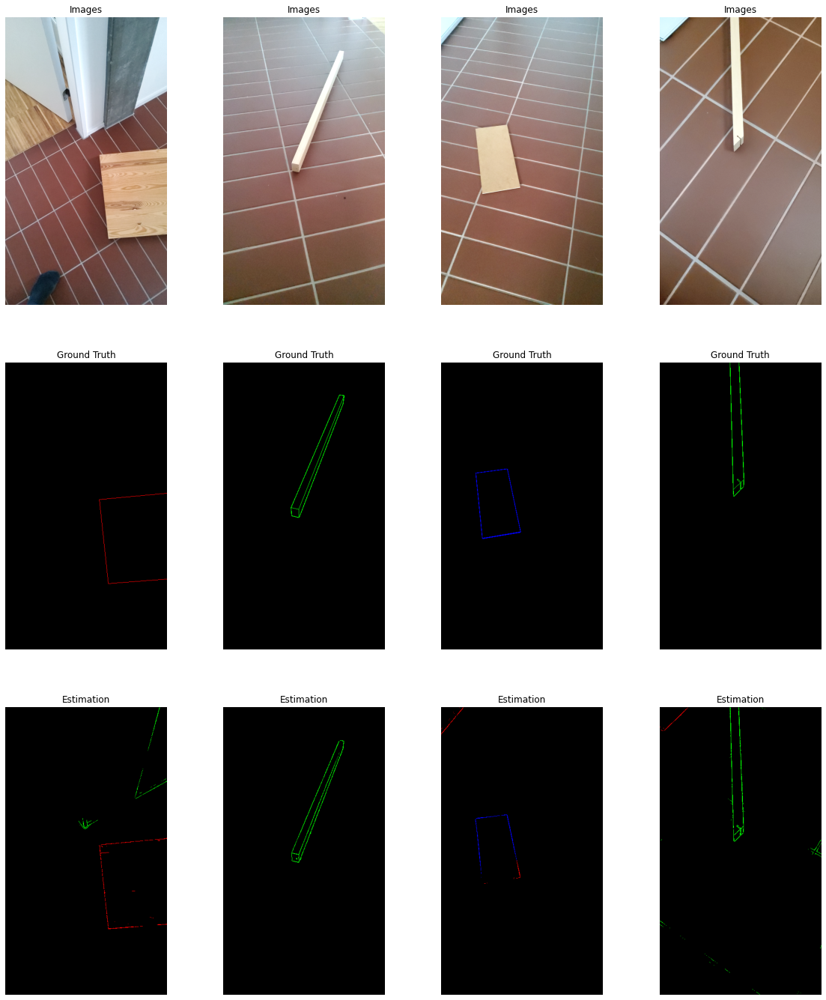

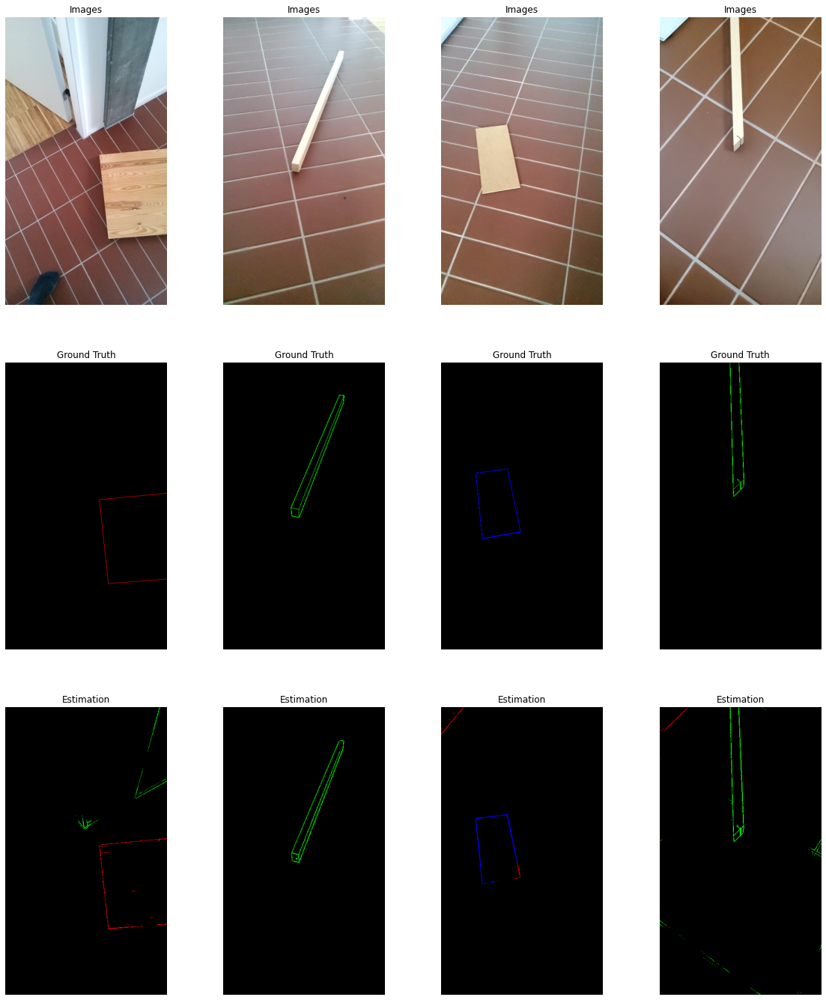

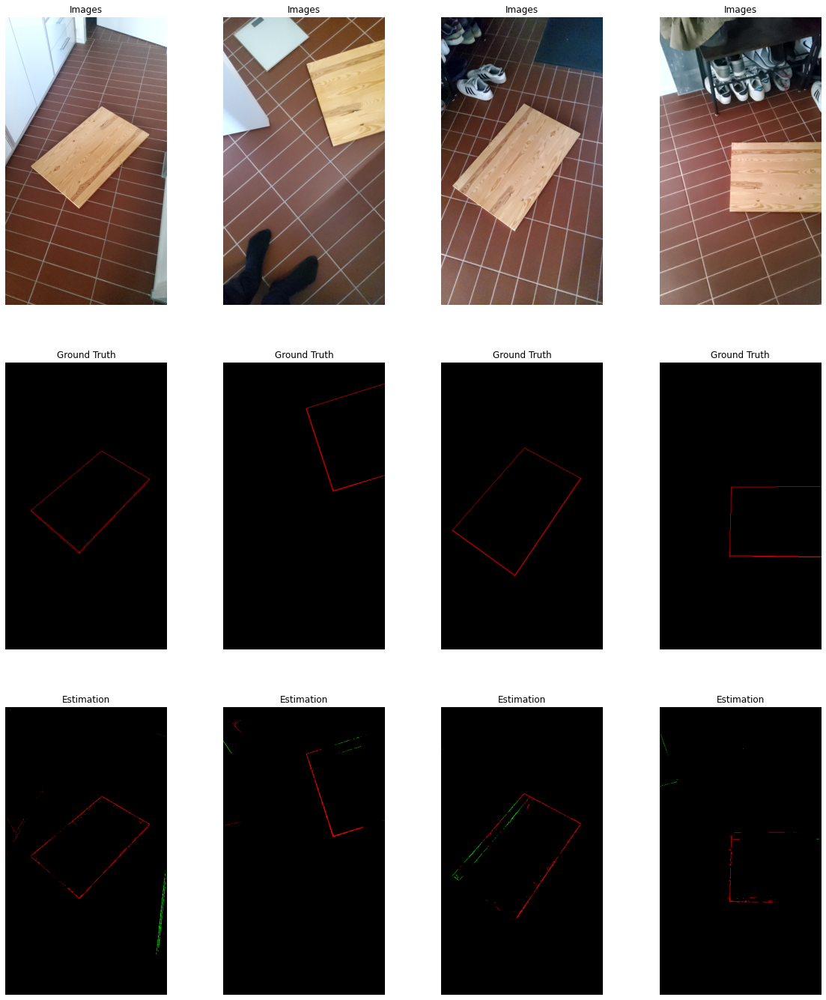

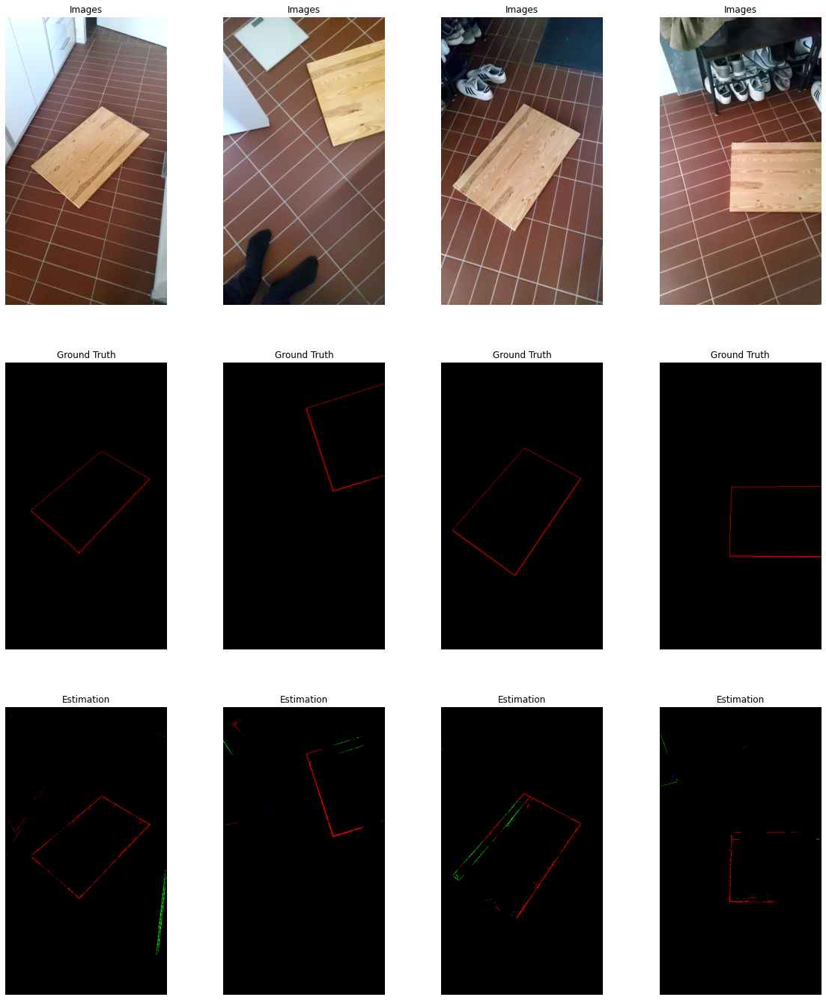

In [8]:
if not TRAIN_MODEL:
    i = 1

    for img, label in test_ds.take(3):
        img, label = img, label

        threshold = 0.5

        predictions = model.predict(img)
        predictions = tools.predict_class_postprocessing(predictions, threshold = threshold)

        path = os.path.join(paths["FIGURES"],"PRE_TRAINING", "images_test_threshold{:.2f}_{}".format(threshold,i))
        visualize.plot_images(images=img, labels=label, predictions=predictions, save=SAVE, path=path, batch_size=BATCH_SIZE)

        threshold = threshold_MF_test
        
        predictions = model.predict(img)    
        predictions = tools.predict_class_postprocessing(predictions, threshold = threshold)

        path = os.path.join(paths["FIGURES"],"PRE_TRAINING", "images_test_ods_{}".format(i))
        visualize.plot_images(images=img, labels=label, predictions=predictions, save=SAVE, path=path, batch_size=BATCH_SIZE)

        i += 1

## test hard

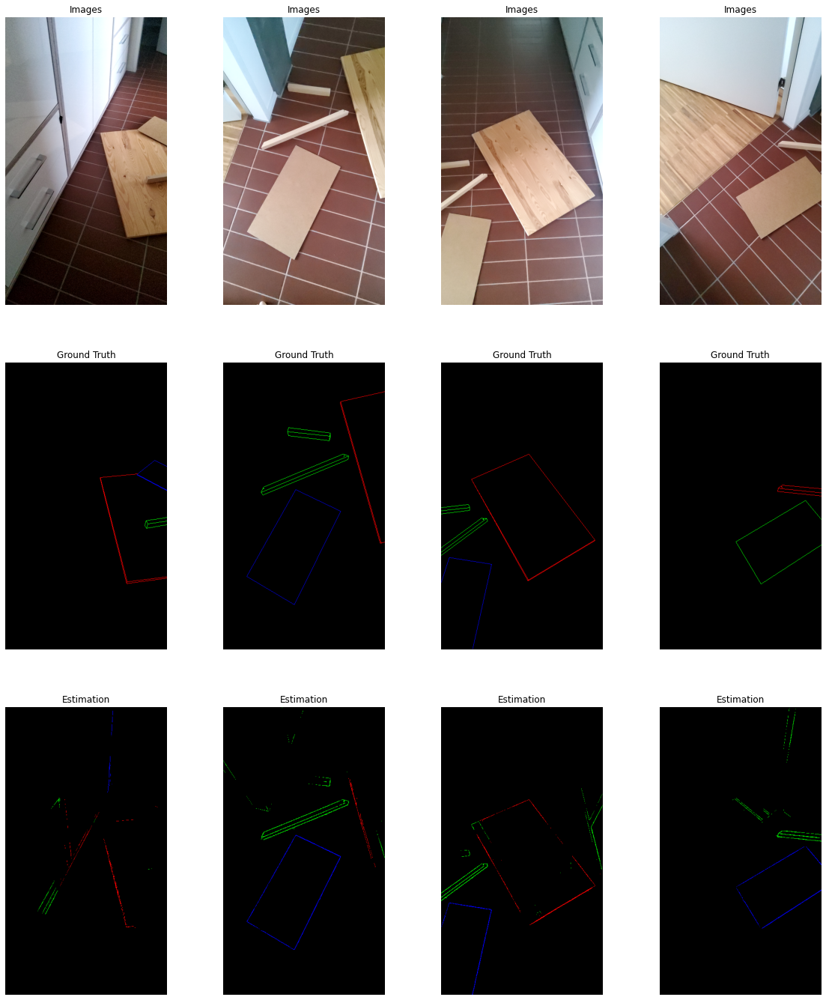

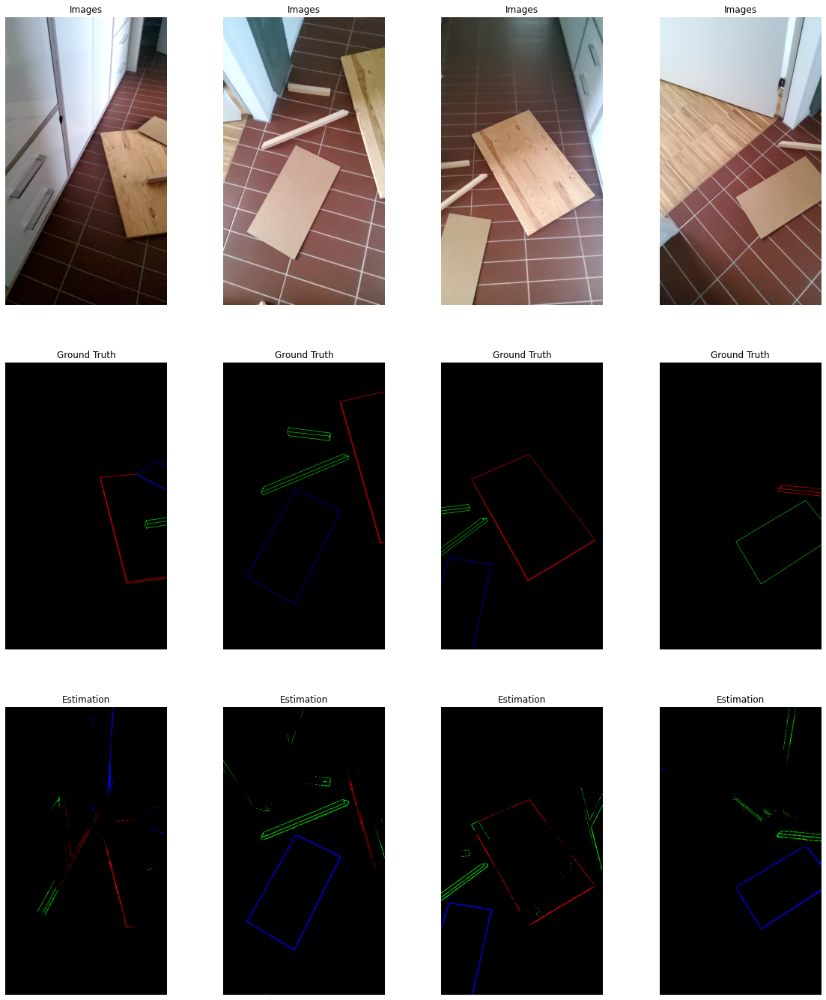

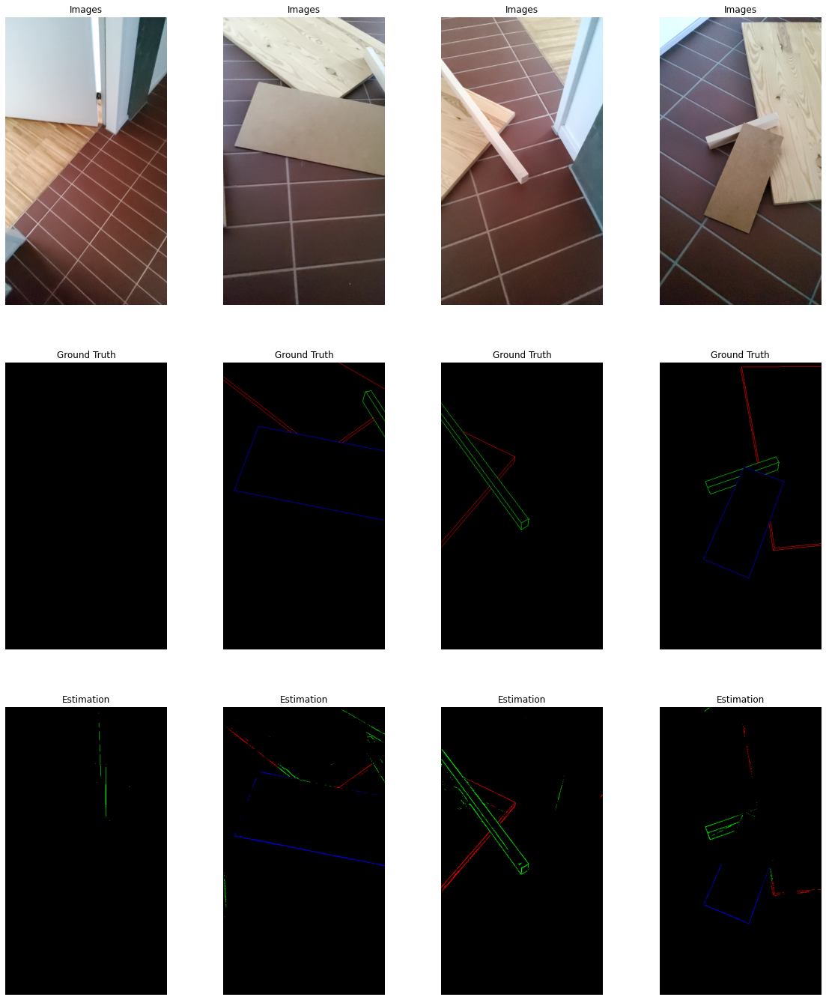

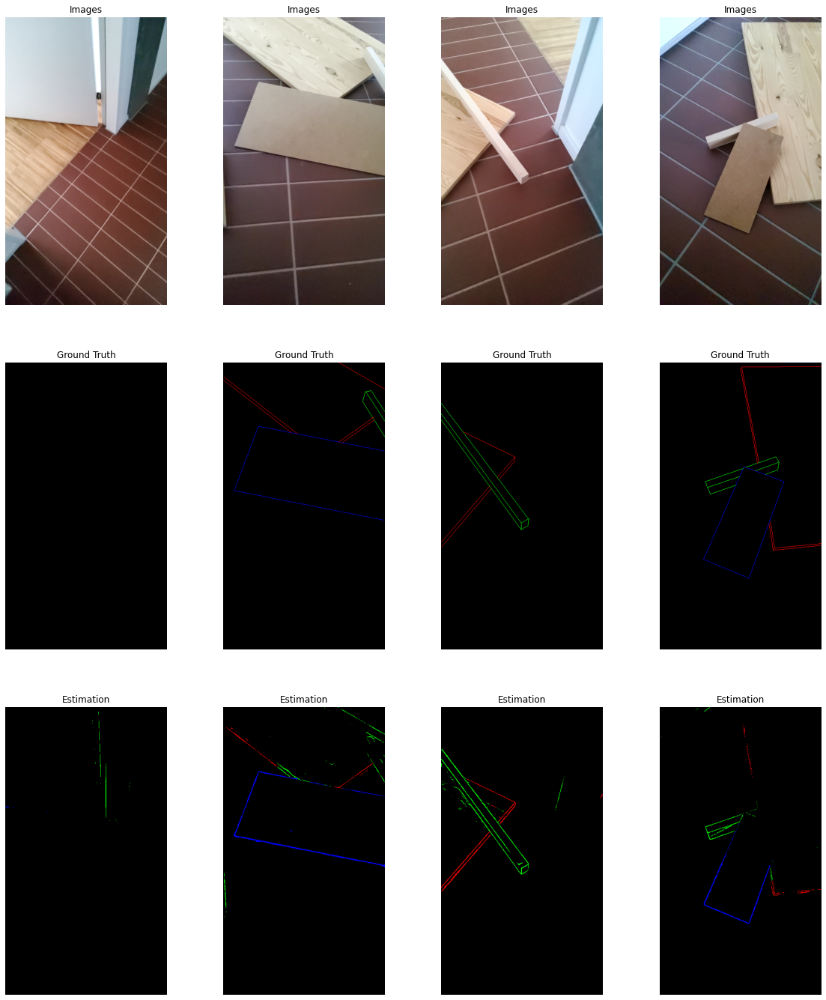

In [9]:
if not TRAIN_MODEL:
    i = 1
    for img, label in test_hard_ds.take(2):
        img, label = img, label

        threshold = 0.5

        predictions = model.predict(img)    
        predictions = tools.predict_class_postprocessing(predictions, threshold = threshold)

        path = os.path.join(paths["FIGURES"],"PRE_TRAINING", "images_test_hard_threshold{:.2f}_{}".format(threshold, i))
        visualize.plot_images(images=img, labels=label, predictions=predictions, save=SAVE, path=path, batch_size=BATCH_SIZE)

        threshold = threshold_MF_test

        predictions = model.predict(img)    
        predictions = tools.predict_class_postprocessing(predictions, threshold = threshold)

        path = os.path.join(paths["FIGURES"],"PRE_TRAINING", "images_test_hard_ods_{}".format(threshold, i))
        visualize.plot_images(images=img, labels=label, predictions=predictions, save=SAVE, path=path, batch_size=BATCH_SIZE)

        i += 1

## test img

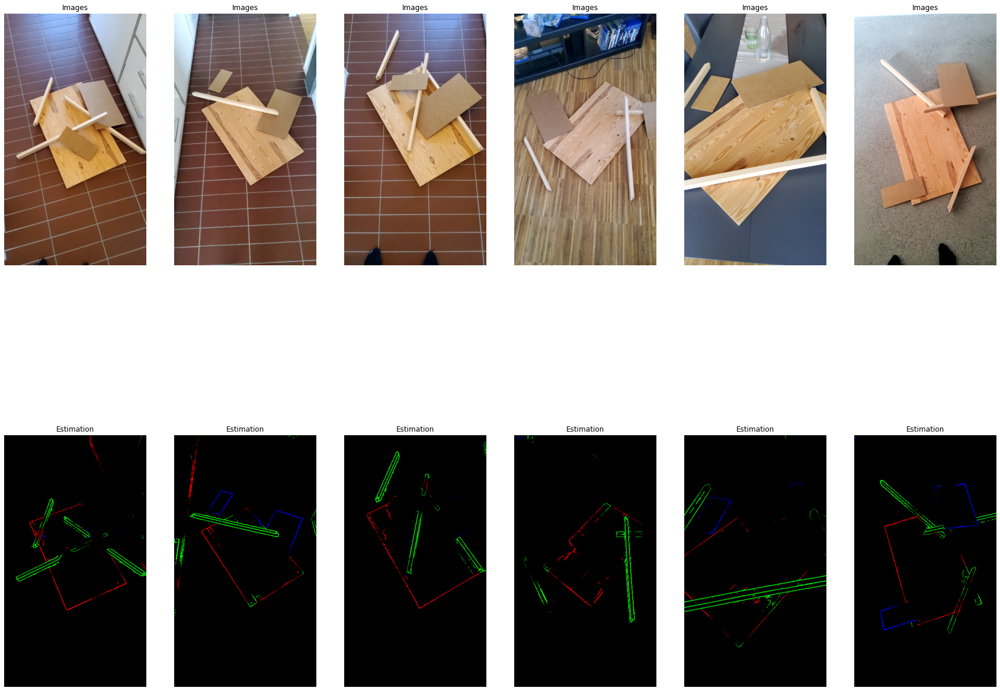

In [10]:
if not TRAIN_MODEL:
    for img in test_img_ds.take(1):
        img = img

    #threshold = threshold_MF_test
    threshold = [0.4, 0.35, 0.35]
    predictions = model.predict(img)    
    predictions = tools.predict_class_postprocessing(predictions, threshold = threshold)

    path = os.path.join(paths["FIGURES"],"PRE_TRAINING", "images_test_img")
    try:
        visualize.plot_images(images=img, labels=None, predictions=predictions, save=SAVE, path=path, batch_size=6)
    except:
        visualize.plot_images(images=img, labels=None, predictions=predictions, save=SAVE, path=path, batch_size=img_count_test_img)

# Compile and Train Model

In [11]:
if TENSORBOARD:
    %load_ext tensorboard
    %tensorboard --logdir /home/david/SemesterProject/Models/CASENet/logs

In [12]:
if TRAIN_MODEL:
    # Fine-tune from this layer onwards
    output_names = ["Conv1", "expanded_conv_project_BN", "block_2_add", "block_5_add", "block_9_add", "block_12_add", "block_15_add", "block_16_project_BN", "out_relu"]
    fine_tune_output = output_names[TRAINABLE_IDX]

    model.trainable = True

    # Freeze all the layers before the `fine_tune_at` layer: 
    for m in model.layers:
        if m.name == "model":
            for submodel in m.layers:
                if submodel.name == "base_model":
                    for layer in submodel.layers[0:100]:
                        layer.trainable = False
                        if layer.name == fine_tune_output:
                            break

In [13]:
if TRAIN_MODEL:         

    # learning rate schedule
    base_learning_rate = 0.0005
    end_learning_rate = 0.00005
    decay_step = np.ceil(img_count_train / BATCH_SIZE)*EPOCHS
    lr_schedule = tf.keras.optimizers.schedules.PolynomialDecay(base_learning_rate,decay_steps = decay_step,end_learning_rate = end_learning_rate, power = 0.9)

    frequency = int(np.ceil(img_count_train / BATCH_SIZE)*MODEL_SAVE_EPOCH_FREQ)+1

    logdir = os.path.join(paths['TBLOGS'], datetime.now().strftime("%Y%m%d-%H%M%S"))
    callbacks = [tf.keras.callbacks.ModelCheckpoint(filepath = paths["CKPT"]+ "/ckpt-loss={val_loss:.2f}-epoch={epoch:.2f}-f1={val_f1:.4f}",
                                                    save_weights_only=False,save_best_only=False,monitor="val_f1",verbose=1,save_freq= 'epoch', period=10),
                tf.keras.callbacks.TensorBoard(log_dir=logdir,histogram_freq=1)]

    # compile model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule),
                  loss=loss,
                  metrics=[metrics.BinaryAccuracyEdges(threshold_prediction=0),
                           metrics.F1Edges(threshold_prediction=0, threshold_edge_width=0)])

    evaluate_test = model.evaluate(test_ds, return_dict = True, batch_size = 3)
    evaluate_train = model.evaluate(train_ds, return_dict = True, batch_size = 3)

    history = model.fit(train_ds, epochs=EPOCHS, validation_data=test_ds, callbacks=callbacks, verbose = 1)

    dict_keys = ['loss', 'accuracy_edges', 'f1', 'precision', 'recall']
    for key in dict_keys:
        history.history[key] = [evaluate_train[key]] + history.history[key]
        history.history['val_'+key] = [evaluate_test[key]] + history.history['val_'+key]

In [14]:
model_ckpt = os.listdir(paths['CKPT'])

f1_max = 0
for ckpt_name in model_ckpt:
    if float(ckpt_name[-4:]) > f1_max:
        f1_max = float(ckpt_name[-4:])
        model_path = paths['CKPT']+"/"+ckpt_name

custom_objects = {"BinaryAccuracyEdges": metrics.BinaryAccuracyEdges,
                  "F1Edges": metrics.F1Edges,
                  "<lambda>":loss}

model = tf.keras.models.load_model(model_path, custom_objects=custom_objects)

# training evolution

In [15]:
if TRAIN_MODEL:
    plot_losses = ["loss"]
    plot_metrics = ["accuracy_edges", "f1", "recall", "precision"]

    path = os.path.join(paths["FIGURES"],"training.svg")

    visualize.plot_training_results(res=history.history, losses=plot_losses, metrics=plot_metrics, save=SAVE, path=path)


    for img, label in train_ds.take(1):
        img, label = img, label

    predictions = model.predict(img)    
    predictions = tools.predict_class_postprocessing(predictions, threshold = 0.5)

    visualize.plot_images(images=img, labels=label, predictions=predictions, save=False, path=path, batch_size=BATCH_SIZE)

# Metric Numerical Results After Fine Tuning on Real World Data

## test

7/7 - 1s - loss: 0.0000e+00 - accuracy_edges: 0.9711 - f1_1: 0.1727 - precision_1: 0.0945 - recall_1: 1.0000 - f1_2: 0.1997 - precision_2: 0.1109 - recall_2: 0.9996 - f1_3: 0.2772 - precision_3: 0.1609 - recall_3: 1.0000 - 1s/epoch - 149ms/step
7/7 - 1s - loss: 0.0000e+00 - accuracy_edges: 0.9828 - f1_1: 0.2640 - precision_1: 0.1521 - recall_1: 0.9996 - f1_2: 0.2902 - precision_2: 0.1698 - recall_2: 0.9973 - f1_3: 0.4172 - precision_3: 0.2639 - recall_3: 0.9965 - 1s/epoch - 154ms/step
7/7 - 1s - loss: 0.0000e+00 - accuracy_edges: 0.9888 - f1_1: 0.3505 - precision_1: 0.2127 - recall_1: 0.9958 - f1_2: 0.3940 - precision_2: 0.2462 - recall_2: 0.9850 - f1_3: 0.4922 - precision_3: 0.3275 - recall_3: 0.9901 - 1s/epoch - 143ms/step
7/7 - 1s - loss: 0.0000e+00 - accuracy_edges: 0.9923 - f1_1: 0.4361 - precision_1: 0.2810 - recall_1: 0.9741 - f1_2: 0.4880 - precision_2: 0.3265 - recall_2: 0.9657 - f1_3: 0.5571 - precision_3: 0.3882 - recall_3: 0.9856 - 1s/epoch - 154ms/step
7/7 - 1s - loss: 0.0

7/7 - 1s - loss: 0.0000e+00 - accuracy_edges: 0.9962 - f1_1: 0.0000e+00 - precision_1: 1.0000 - recall_1: 0.0000e+00 - f1_2: 0.0065 - precision_2: 1.0000 - recall_2: 0.0032 - f1_3: 0.0012 - precision_3: 1.0000 - recall_3: 5.8320e-04 - 1s/epoch - 145ms/step
7/7 - 1s - loss: 0.0000e+00 - accuracy_edges: 0.9962 - f1_1: 0.0000e+00 - precision_1: 1.0000 - recall_1: 0.0000e+00 - f1_2: 3.2428e-04 - precision_2: 1.0000 - recall_2: 1.6217e-04 - f1_3: 0.0000e+00 - precision_3: 1.0000 - recall_3: 0.0000e+00 - 1s/epoch - 201ms/step
7/7 - 1s - loss: 0.0000e+00 - accuracy_edges: 0.9962 - f1_1: 0.0000e+00 - precision_1: 1.0000 - recall_1: 0.0000e+00 - f1_2: 0.0000e+00 - precision_2: 1.0000 - recall_2: 0.0000e+00 - f1_3: 0.0000e+00 - precision_3: 1.0000 - recall_3: 0.0000e+00 - 1s/epoch - 145ms/step
7/7 - 1s - loss: 0.0000e+00 - accuracy_edges: 0.9962 - f1_1: 0.0000e+00 - precision_1: 1.0000 - recall_1: 0.0000e+00 - f1_2: 0.0000e+00 - precision_2: 1.0000 - recall_2: 0.0000e+00 - f1_3: 0.0000e+00 - pre

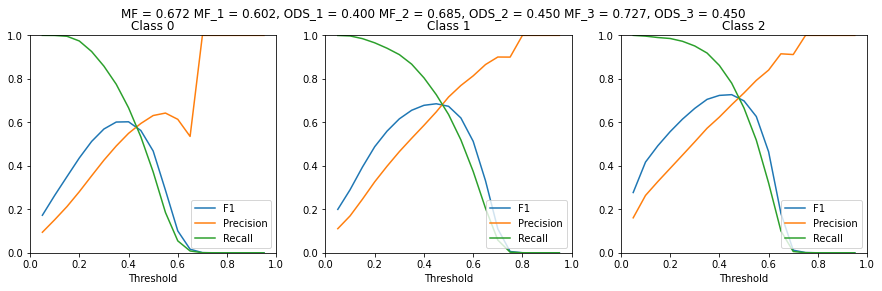

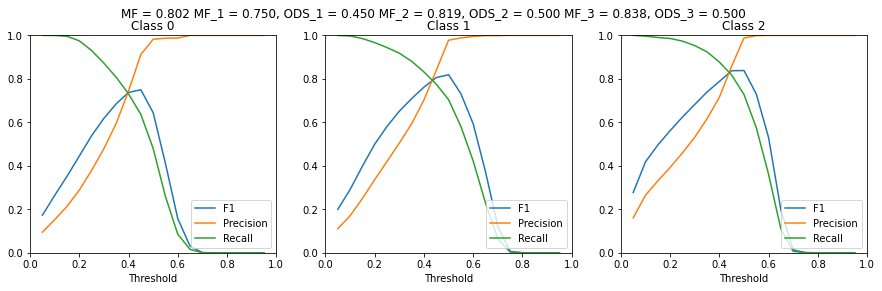

In [16]:
if not TRAIN_MODEL:
    step_width = 0.05
    threshold_range = [0.05,0.95]
    threshold_array = np.arange(threshold_range[0],threshold_range[1]+step_width,step_width)

    path_metrics_evaluation_plot = os.path.join(paths["FIGURES"],"POST_TRAINING", "metric_test_threshold{:.1f}.svg".format(0))
    threshold_MF_test = visualize.plot_threshold_metrics_evaluation_class(model=model, 
                                                                          ds=test_ds,
                                                                          num_classes = NUM_CLASSES,
                                                                          threshold_array=threshold_array,
                                                                          threshold_edge_width=0, 
                                                                          save=SAVE, 
                                                                          path=path_metrics_evaluation_plot,)

    path_metrics_evaluation_plot = os.path.join(paths["FIGURES"],"POST_TRAINING", "metric_test_threshold{:.1f}.svg".format(THRESHOLD_EDGE_WIDTH_REAL))
    visualize.plot_threshold_metrics_evaluation_class(model=model, 
                                                ds=test_ds,
                                                num_classes = NUM_CLASSES,
                                                threshold_array=threshold_array, 
                                                threshold_edge_width=THRESHOLD_EDGE_WIDTH_REAL, 
                                                save=SAVE, 
                                                path=path_metrics_evaluation_plot,)

## test hard

if not TRAIN_MODEL:
    step_width = 0.05
    threshold_range = [0.05,0.95]
    threshold_array = np.arange(threshold_range[0],threshold_range[1]+step_width,step_width)

    path_metrics_evaluation_plot = os.path.join(paths["FIGURES"],"POST_TRAINING", "metric_test_hard_threshold{:.1f}.svg".format(0))
    threshold_MF_test_hard = visualize.plot_threshold_metrics_evaluation_class(model=model, 
                                                                         ds=test_hard_ds,
                                                                         num_classes = NUM_CLASSES,
                                                                         threshold_array=threshold_array, 
                                                                         threshold_edge_width=0, 
                                                                         save=SAVE, 
                                                                         path=path_metrics_evaluation_plot)

    path_metrics_evaluation_plot = os.path.join(paths["FIGURES"],"POST_TRAINING", "metric_test_hard_threshold{:.1f}.svg".format(THRESHOLD_EDGE_WIDTH_REAL))
    visualize.plot_threshold_metrics_evaluation_class(model=model, 
                                                num_classes = NUM_CLASSES
                                                ds=test_hard_ds, 
                                                threshold_array=threshold_array, 
                                                threshold_edge_width=THRESHOLD_EDGE_WIDTH_REAL, 
                                                save=SAVE, 
                                                path=path_metrics_evaluation_plot)

# Visual Results After Fine Tuning on Real World Data

## test

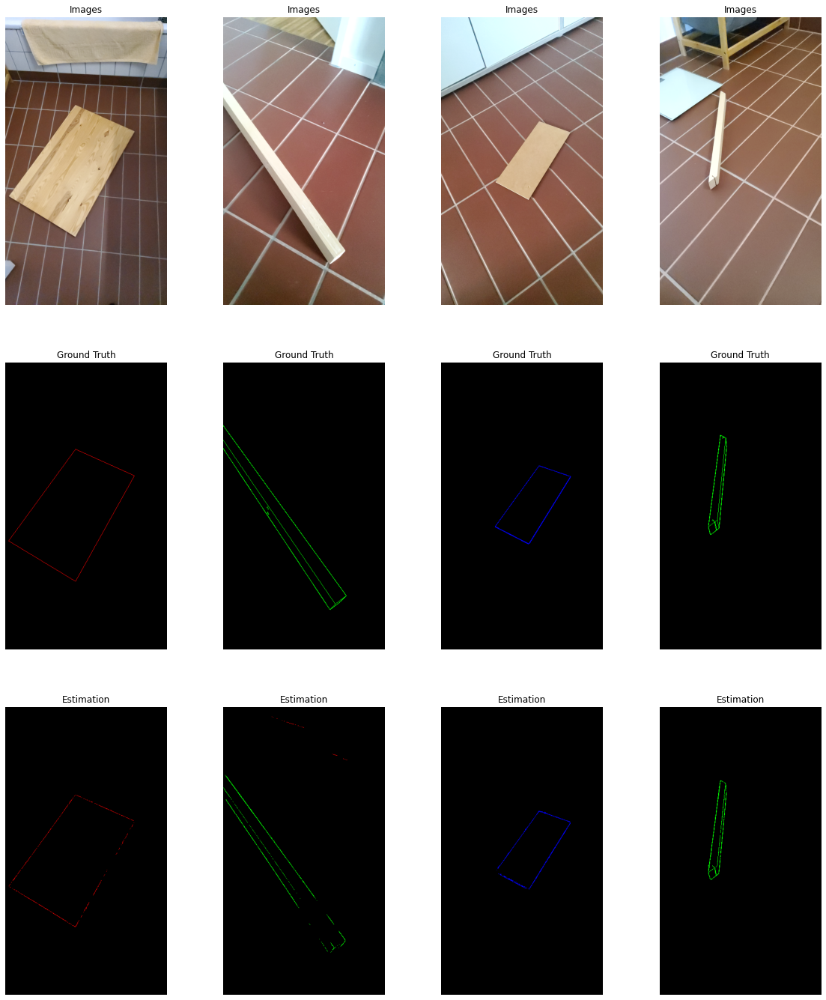

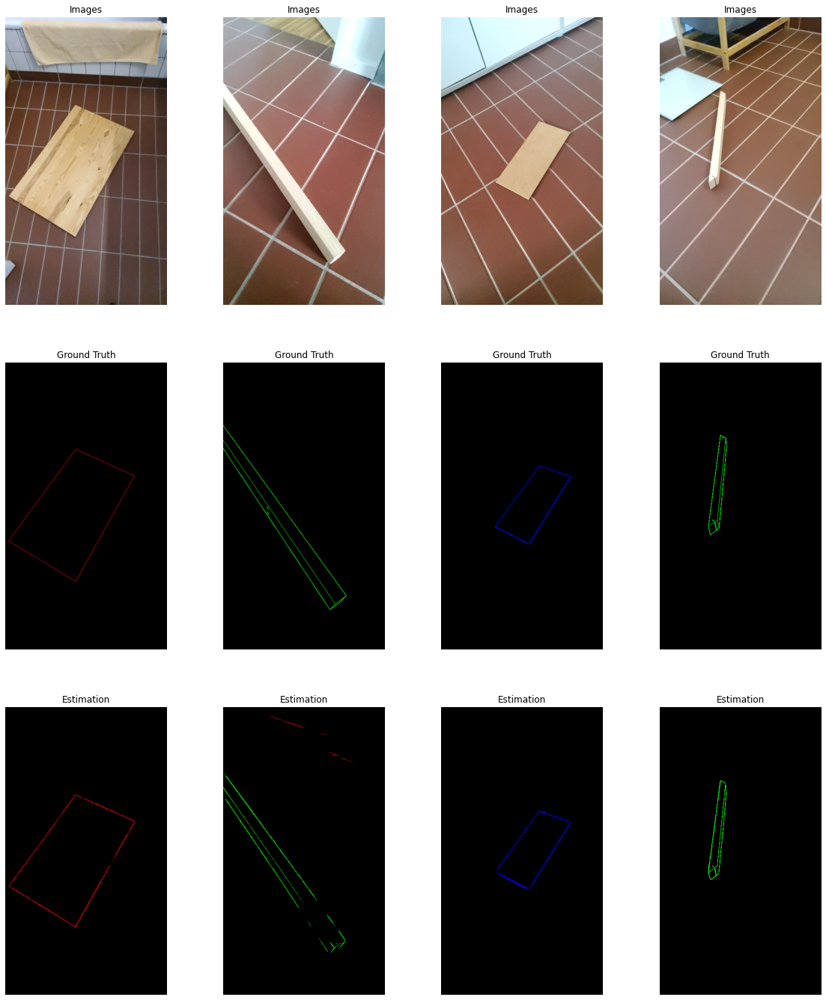

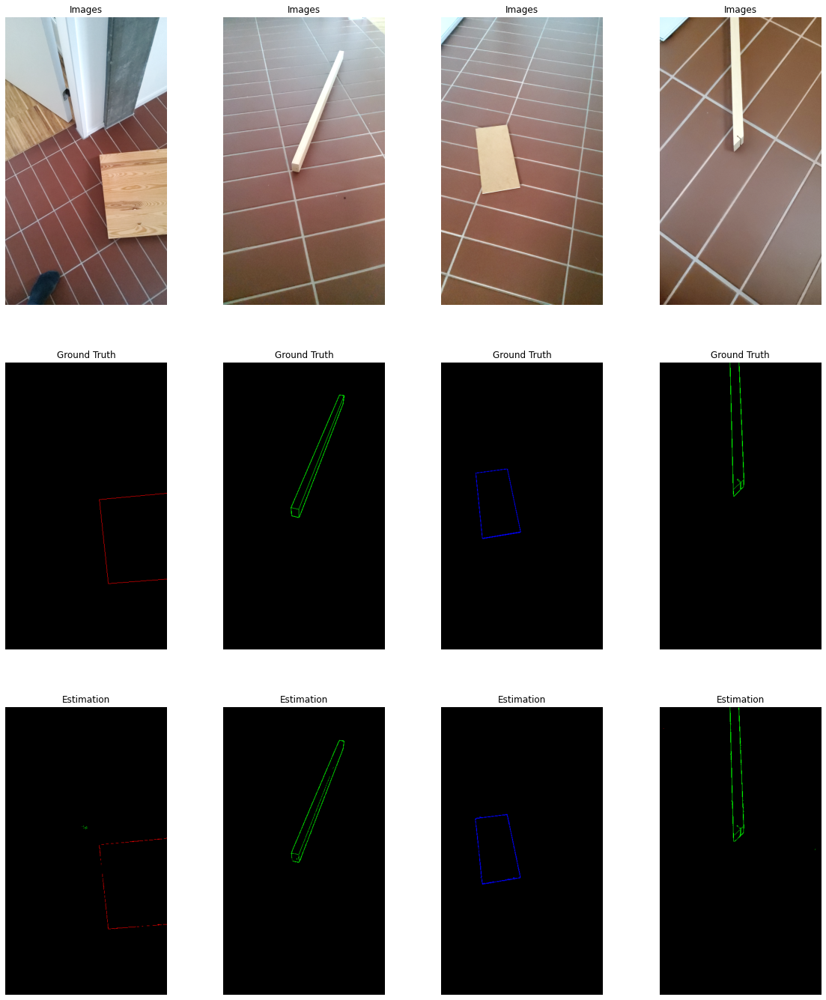

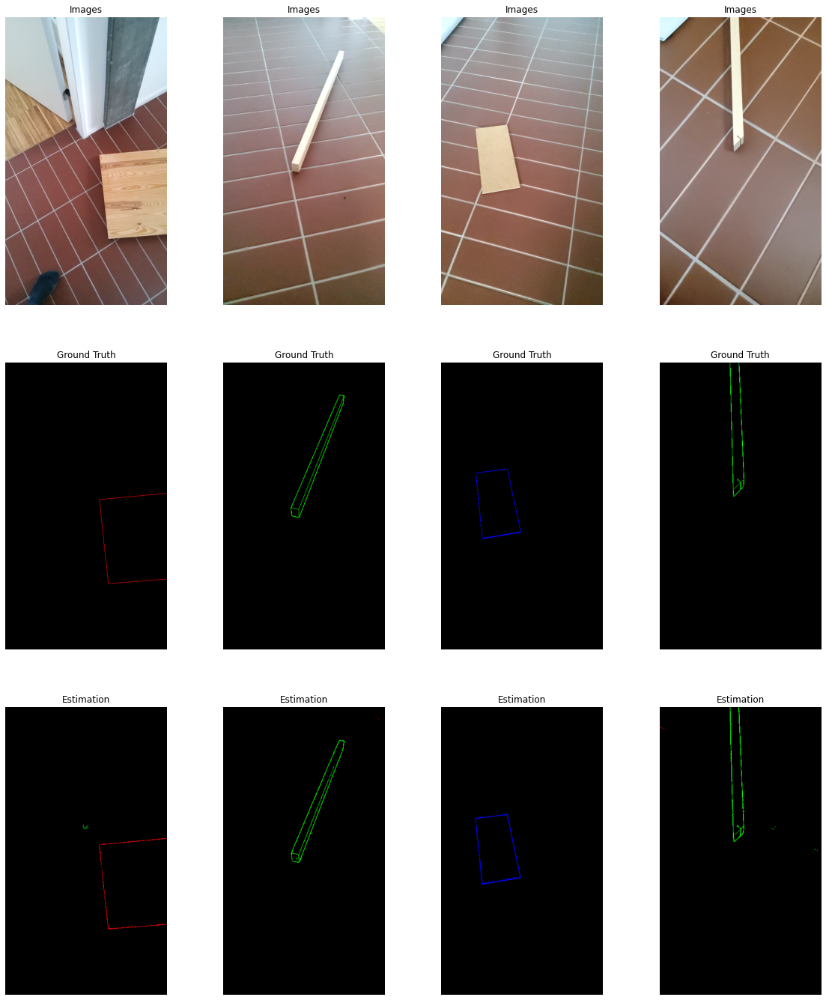

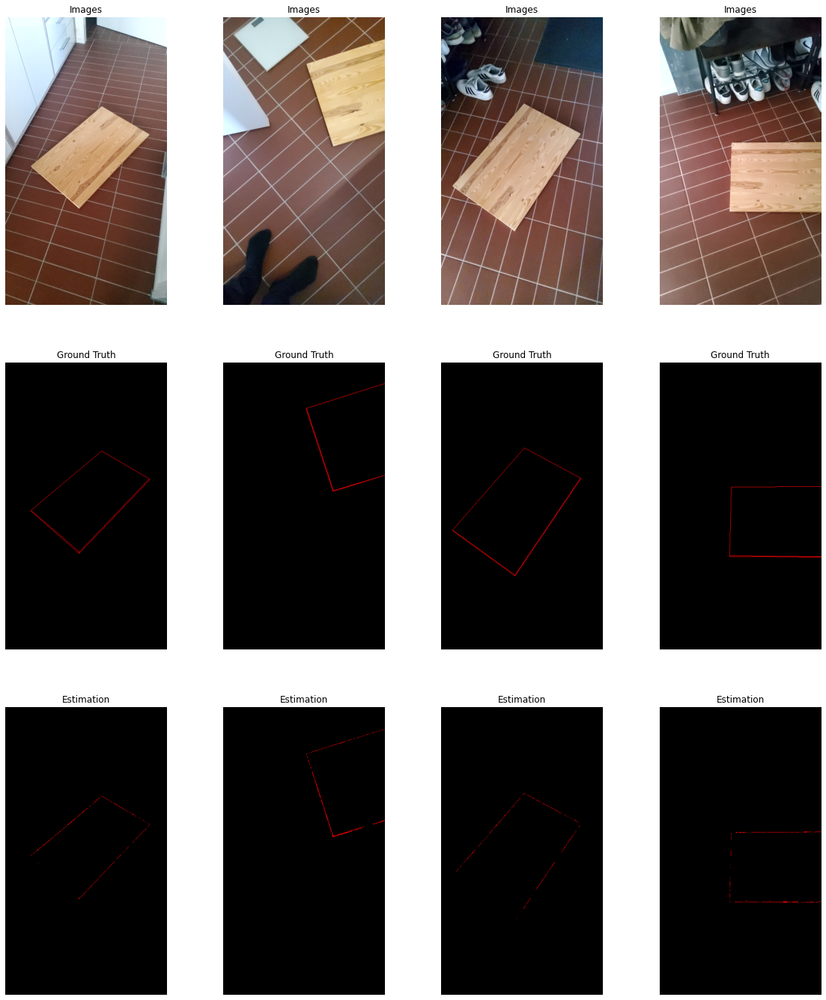

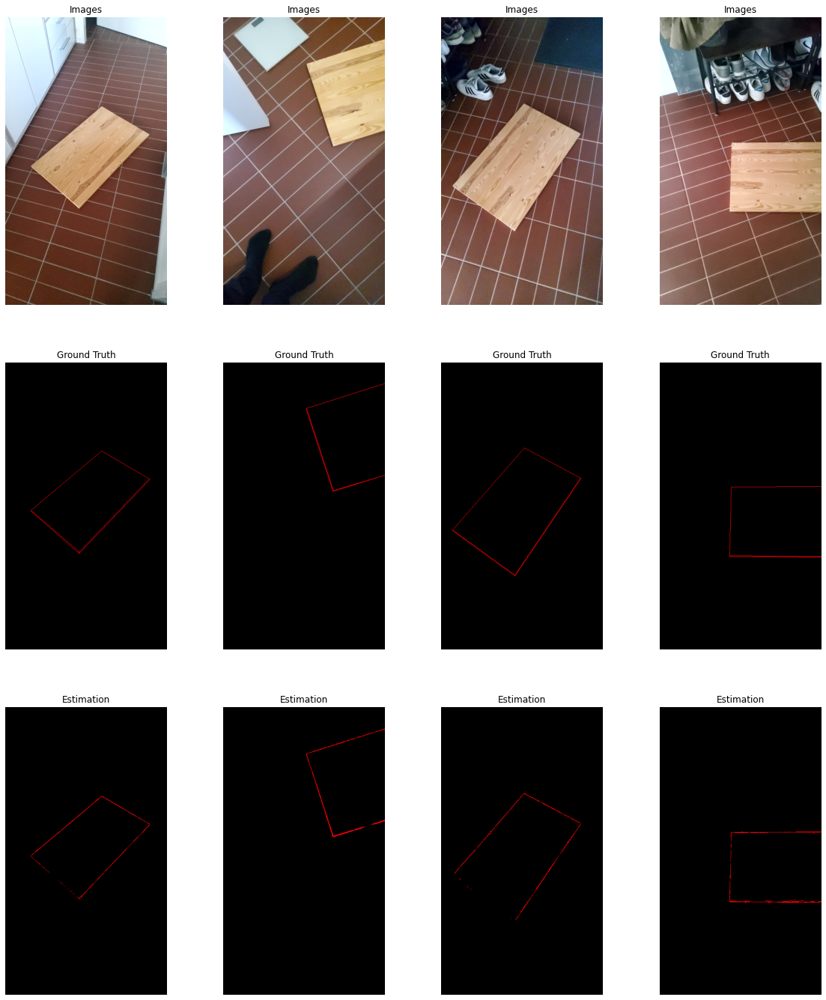

In [17]:
if not TRAIN_MODEL:
    i = 1
    for img, label in test_ds.take(3):
        img, label = img, label

        threshold = 0.5
        predictions = model.predict(img)    
        predictions = tools.predict_class_postprocessing(predictions, threshold = threshold)

        path = os.path.join(paths["FIGURES"],"POST_TRAINING", "images_test_threshold_{:.2f}_{}".format(threshold, i))
        visualize.plot_images(images=img, labels=label, predictions=predictions, save=SAVE, path=path, batch_size=BATCH_SIZE)

        threshold = threshold_MF_test
        predictions = model.predict(img)    
        predictions = tools.predict_class_postprocessing(predictions, threshold = threshold)

        path = os.path.join(paths["FIGURES"],"POST_TRAINING", "images_test_threshold_ods_{}".format(i))
        visualize.plot_images(images=img, labels=label, predictions=predictions, save=SAVE, path=path, batch_size=BATCH_SIZE)

        i += 1

## test hard

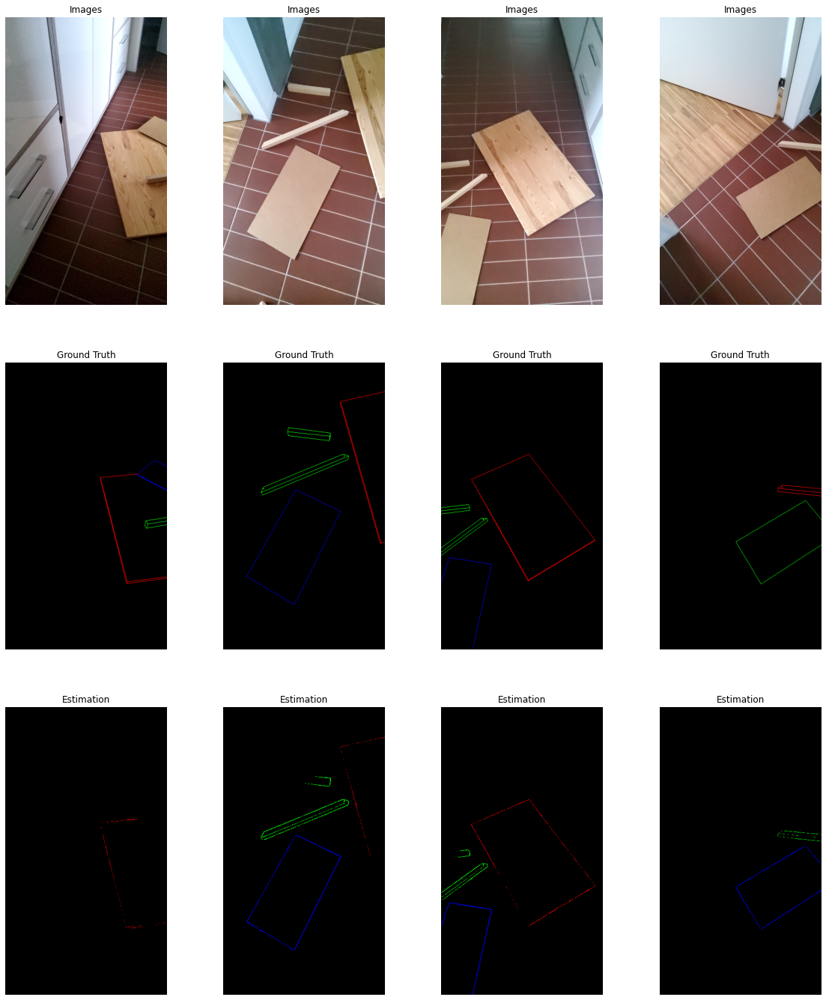

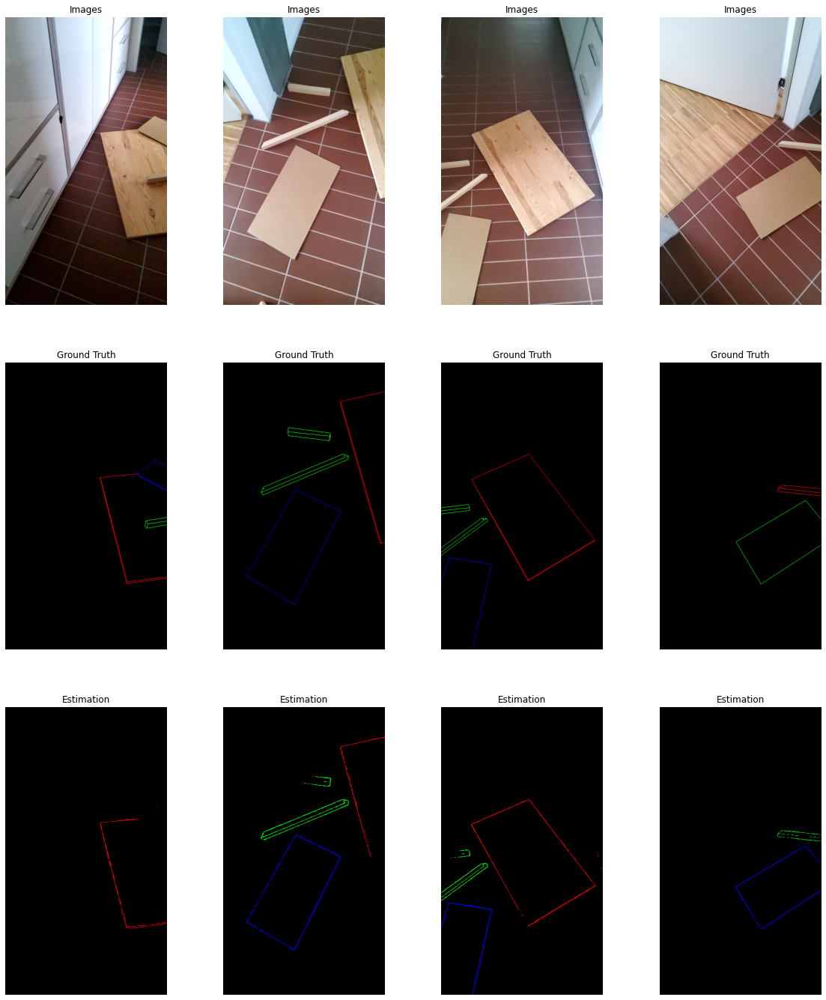

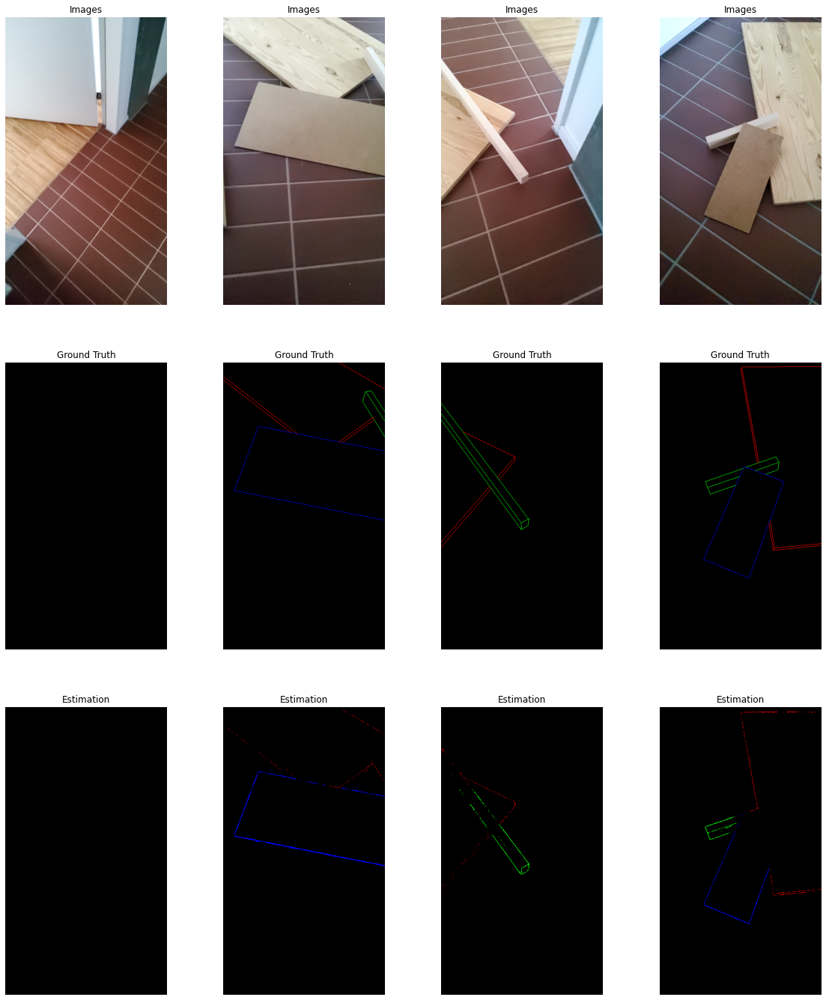

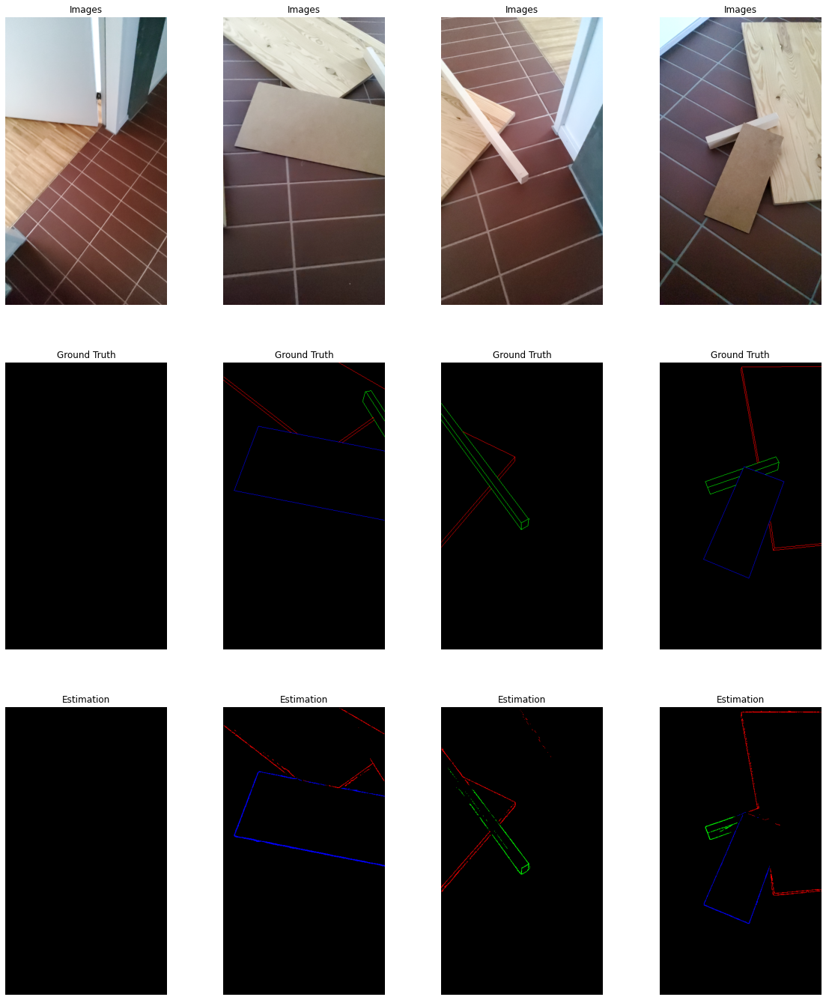

In [18]:
if not TRAIN_MODEL:
    i = 1
    for img, label in test_hard_ds.take(2):
        img, label = img, label

        threshold = 0.5

        predictions = model.predict(img)    
        predictions = tools.predict_class_postprocessing(predictions, threshold = threshold)

        path = os.path.join(paths["FIGURES"],"POST_TRAINING", "images_test_hard_threshold{:.2f}_{}".format(threshold,i))
        visualize.plot_images(images=img, labels=label, predictions=predictions, save=SAVE, path=path, batch_size=BATCH_SIZE)

        threshold = threshold_MF_test

        predictions = model.predict(img)    
        predictions = tools.predict_class_postprocessing(predictions, threshold = threshold)

        path = os.path.join(paths["FIGURES"],"POST_TRAINING", "images_test_hard_ods_{}".format(i))
        visualize.plot_images(images=img, labels=label, predictions=predictions, save=SAVE, path=path, batch_size=BATCH_SIZE)

        i += 1


## test img

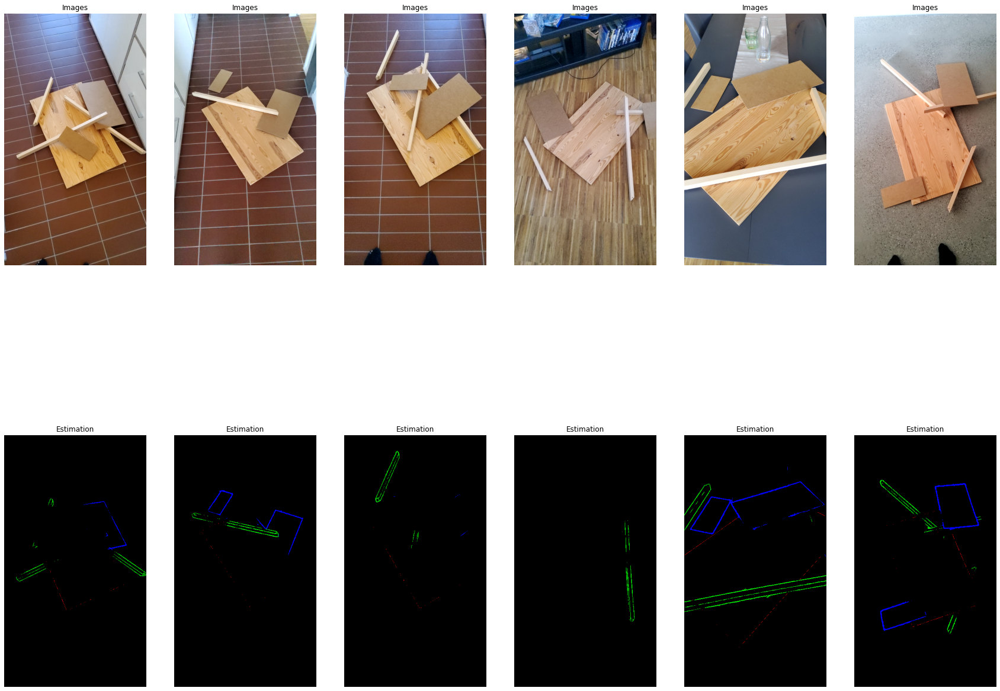

In [19]:
if not TRAIN_MODEL:
    for img in test_img_ds.take(1):
        img = img

    predictions = model.predict(img)
    
    #threshold = threshold_MF_test
    threshold = [0.6, 0.4, 0.3]
    predictions = tools.predict_class_postprocessing(predictions, threshold = threshold)

    path = os.path.join(paths["FIGURES"],"POST_TRAINING", "images_test_img")

    try:
        visualize.plot_images(images=img, labels=None, predictions=predictions, save=SAVE, path=path, batch_size=6)
    except:
        visualize.plot_images(images=img, labels=None, predictions=predictions, save=SAVE, path=path, batch_size=img_count_test_img)

# Save Model

In [20]:
model.compile(optimizer=tf.keras.optimizers.Adam(),
                  loss=loss,
                  metrics={'output': [metrics.BinaryAccuracyEdges(threshold_prediction=0),
                                      metrics.F1Edges(threshold_prediction=0, threshold_edge_width=0)]})

if SAVE and TRAIN_MODEL:
    model.save(paths["MODEL"])
    
    custom_objects = {"BinaryAccuracyEdges": metrics.BinaryAccuracyEdges,
                      "F1Edges": metrics.F1Edges,
                      "<lambda>":loss}
    
    model = tf.keras.models.load_model(paths["MODEL"], custom_objects=custom_objects)

# Addtional Elements to Consider in other Projects

* Data augmentation for small datasets